In [1]:
# import the necessary DataScience and Machine Learning Libraries
import pandas as pd
import numpy as np
import plotly.express as px
from matplotlib import pyplot as plt
import seaborn as sns
sns.set()

from scipy.stats import chi2_contingency

from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

import lightgbm as lgb
from xgboost import XGBClassifier

from sklearn.metrics import precision_recall_curve, auc, roc_curve

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, ConfusionMatrixDisplay

In [2]:
data = pd.read_csv('loan_default.csv', index_col = 0)
data.shape

(10000, 4)

# EDA

In [3]:
data.head()

,Employed,Bank Balance,Annual Salary,Defaulted?
Index,,,,
1,1,8754.36,532339.56,0
2,0,9806.16,145273.56,0
3,1,12882.60,381205.68,0
4,1,6351.00,428453.88,0
5,1,9427.92,461562.00,0


In [4]:
RAND_SEED = 123

In [5]:
data.isnull().sum()

Employed         0
Bank Balance     0
Annual Salary    0
Defaulted?       0
dtype: int64

In [6]:
data.duplicated().sum()

0

In [7]:
data.describe()

,Employed,Bank Balance,Annual Salary,Defaulted?
count,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.705600,10024.498524,402203.782224,0.033300
std,0.455795,5804.579486,160039.674988,0.179428
min,0.000000,0.000000,9263.640000,0.000000
25%,0.000000,5780.790000,256085.520000,0.000000
50%,1.000000,9883.620000,414631.740000,0.000000
75%,1.000000,13995.660000,525692.760000,0.000000
max,1.000000,31851.840000,882650.760000,1.000000


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 1 to 10000
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Employed       10000 non-null  int64  
 1   Bank Balance   10000 non-null  float64
 2   Annual Salary  10000 non-null  float64
 3   Defaulted?     10000 non-null  int64  
dtypes: float64(2), int64(2)
memory usage: 390.6 KB


In [9]:
data.insert(3, 'Saving Rate', data['Bank Balance'] / data['Annual Salary'])
data.head()

,Employed,Bank Balance,Annual Salary,Saving Rate,Defaulted?
Index,,,,,
1,1,8754.36,532339.56,0.016445,0
2,0,9806.16,145273.56,0.067501,0
3,1,12882.60,381205.68,0.033794,0
4,1,6351.00,428453.88,0.014823,0
5,1,9427.92,461562.00,0.020426,0


In [10]:
table = data['Defaulted?'].value_counts().reset_index()
table.columns = ['Status', 'Number']
table['Status'] = table['Status'].map({1: 'Defaulted', 0: 'Not defaulted'})
table

,Status,Number
0,Not defaulted,9667
1,Defaulted,333


In [11]:
fig = px.pie(table, values='Number', names='Status', title='Default Status')
fig.show()

In [12]:
table = data['Employed'].value_counts().reset_index()
table.columns = ['Status', 'Number']
table['Status'] = table['Status'].map({1: 'Employed', 0: 'Unemployed'})
table

,Status,Number
0,Employed,7056
1,Unemployed,2944


In [13]:
fig = px.pie(table, values='Number', names='Status', title='Employed Status')
fig.show()

In [14]:
table = data.copy()
table['Employed'] = table['Employed'].map({1 :'Employed', 0 :'Unemployed'})
table['Defaulted?'] = table['Defaulted?'].map({1 :'Defaulted', 0 :'Not defaulted'})

In [15]:
fig = px.sunburst(table, 
                  path=['Employed','Defaulted?'],
                  title='Default related with employment')
fig.show()

In [16]:
table = pd.crosstab(data['Employed'], data['Defaulted?'])
table

Defaulted?,0,1
Employed,,
0,2817,127
1,6850,206


In [17]:
chi2, p, dof, ex = chi2_contingency(table)
p

0.0004997256756210478

In [18]:
fig = px.histogram(data, x="Bank Balance", color='Defaulted?', 
                   marginal="box", # or violin, rug
                   hover_data=data.columns)
fig.show()

In [19]:
(data['Bank Balance'] <= 10).sum()

501

In [20]:
fig = px.histogram(data, x="Annual Salary",
                   color="Defaulted?",
                   marginal="box", # or violin, rug
                   hover_data=data.columns)
fig.show()

In [21]:
fig = px.histogram(data, x="Saving Rate",
                   color='Defaulted?', 
                   marginal="box", # or violin, rug
                   hover_data=data.columns)
fig.show()

In [22]:
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,:-1], data.iloc[:,-1], test_size=0.3, 
                                                    stratify=data.iloc[:,-1], random_state=RAND_SEED)

In [23]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(7000, 4) (3000, 4) (7000,) (3000,)


In [24]:
scaler = StandardScaler().fit(X_train)

In [25]:
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [26]:
y_train.value_counts()

0    6767
1     233
Name: Defaulted?, dtype: int64

In [27]:
sm = SMOTE(random_state=RAND_SEED)
X_train, y_train = sm.fit_resample(X_train, y_train)

In [28]:
X_train.shape, y_train.shape

((13534, 4), (13534,))

In [29]:
y_train.value_counts()

0    6767
1    6767
Name: Defaulted?, dtype: int64

## Models
# Logistic Regression

In [30]:
clf = LogisticRegression(solver='saga', random_state=RAND_SEED).fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [31]:
cross_val_score(clf, X_train, y_train, scoring='recall', cv=5, )

array([0.91574279, 0.90613452, 0.9084195 , 0.90915805, 0.90909091])

In [32]:
print(confusion_matrix(y_test, y_pred))

[[2548  352]
 [  15   85]]


In [33]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.88      0.93      2900
           1       0.19      0.85      0.32       100

    accuracy                           0.88      3000
   macro avg       0.59      0.86      0.62      3000
weighted avg       0.97      0.88      0.91      3000



In [34]:
distributions = dict(C=np.linspace(2, 1000, 100), penalty=['l2', 'l1'])

In [35]:
clf = RandomizedSearchCV(LogisticRegression(solver='saga',random_state=RAND_SEED), 
                         distributions, scoring='recall', n_iter=100, n_jobs=-1, 
                         random_state=RAND_SEED)
clf_logistic = clf.fit(X_train, y_train)
clf_logistic.best_params_

{'penalty': 'l2', 'C': 254.02020202020202}

In [36]:
y_pred_logistic = clf_logistic.predict(X_test)

In [37]:
print(confusion_matrix(y_test, y_pred_logistic))

[[2547  353]
 [  15   85]]


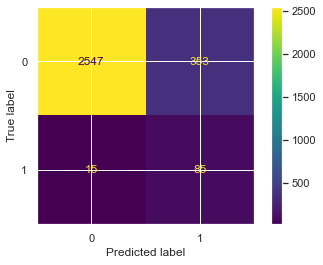

In [38]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_logistic)
plt.show()

In [39]:
print(classification_report(y_test, y_pred_logistic))

              precision    recall  f1-score   support

           0       0.99      0.88      0.93      2900
           1       0.19      0.85      0.32       100

    accuracy                           0.88      3000
   macro avg       0.59      0.86      0.62      3000
weighted avg       0.97      0.88      0.91      3000



# SVC

In [40]:
clf = SVC(probability=True)
clf.fit(X_train, y_train)

SVC(probability=True)

In [41]:
cross_val_score(clf, X_train, y_train, scoring='recall', cv=5)

array([0.94604582, 0.94826312, 0.94017725, 0.94239291, 0.94604582])

In [42]:
y_pred=clf.predict(X_test)

In [43]:
confusion_matrix(y_test, y_pred)

array([[2427,  473],
       [  11,   89]], dtype=int64)

In [44]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.84      0.91      2900
           1       0.16      0.89      0.27       100

    accuracy                           0.84      3000
   macro avg       0.58      0.86      0.59      3000
weighted avg       0.97      0.84      0.89      3000



In [45]:
distributions = dict(C=np.logspace(0, 4, 50),
                     degree = np.arange(1,10,1),
                     class_weight = [None, 'balanced'],)

In [46]:
clf = RandomizedSearchCV(SVC(probability=True, cache_size = 1024*25), 
                         distributions, scoring='recall', n_iter=1, 
                         n_jobs = 1, random_state=RAND_SEED) 
clf_SVC = clf.fit(X_train, y_train)
clf_SVC.best_params_

{'degree': 7, 'class_weight': None, 'C': 193.06977288832496}

In [47]:
y_pred_SVC = clf_SVC.predict(X_test)

In [48]:
print(confusion_matrix(y_test,y_pred_SVC))

[[2427  473]
 [  13   87]]


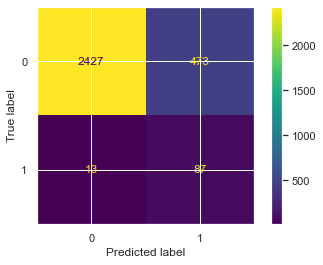

In [49]:
ConfusionMatrixDisplay.from_predictions(y_test,y_pred_SVC)
plt.show()

In [50]:
print(classification_report(y_test,y_pred_SVC))

              precision    recall  f1-score   support

           0       0.99      0.84      0.91      2900
           1       0.16      0.87      0.26       100

    accuracy                           0.84      3000
   macro avg       0.58      0.85      0.59      3000
weighted avg       0.97      0.84      0.89      3000



# Random forest

In [51]:
clf = RandomForestClassifier()
clf.fit(X_train, y_train)

RandomForestClassifier()

In [52]:
y_pred = clf.predict(X_test)

In [53]:
cross_val_score(clf, X_train, y_train, scoring='recall', cv=5)

array([0.96230599, 0.95934959, 0.95568685, 0.95125554, 0.9571323 ])

In [54]:
print(confusion_matrix(y_test, y_pred))

[[2665  235]
 [  33   67]]


In [55]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.92      0.95      2900
           1       0.22      0.67      0.33       100

    accuracy                           0.91      3000
   macro avg       0.60      0.79      0.64      3000
weighted avg       0.96      0.91      0.93      3000



In [56]:
distributions = dict(n_estimators=np.arange(10, 500, 10),
                     criterion=['gini', 'entropy'],
                     max_depth = range(20),
                     min_samples_split = range(2, 20),
                     min_samples_leaf = range(3, 50),
                     bootstrap = [True, False],
                     class_weight = ['balanced', 'balanced_subsample']
                    )

In [57]:
clf = RandomizedSearchCV(RandomForestClassifier(), 
                         distributions,
                         scoring='recall', 
                         n_iter=20,
                         n_jobs = 4,
                         random_state=RAND_SEED)
clf_random_forest = clf.fit(X_train, y_train)
clf_random_forest.best_params_


{'n_estimators': 490,
 'min_samples_split': 14,
 'min_samples_leaf': 5,
 'max_depth': 8,
 'criterion': 'gini',
 'class_weight': 'balanced_subsample',
 'bootstrap': False}

In [58]:
y_pred_random_forest = clf_random_forest.predict(X_test)

In [59]:
print(confusion_matrix(y_test,y_pred_random_forest))

[[2547  353]
 [  18   82]]


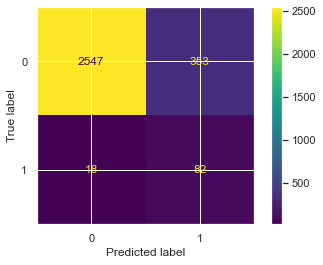

In [60]:
ConfusionMatrixDisplay.from_predictions(y_test,y_pred_random_forest)
plt.show()

In [61]:
print(classification_report(y_test,y_pred_random_forest))

              precision    recall  f1-score   support

           0       0.99      0.88      0.93      2900
           1       0.19      0.82      0.31       100

    accuracy                           0.88      3000
   macro avg       0.59      0.85      0.62      3000
weighted avg       0.97      0.88      0.91      3000



# LightGBM

In [62]:
clf = lgb.LGBMClassifier()
clf.fit(X_train, y_train)

LGBMClassifier()

In [63]:
y_pred  = clf.predict(X_test)

In [64]:
cross_val_score(clf, X_train, y_train, scoring='recall', cv=5, )

array([0.95934959, 0.9563932 , 0.95420975, 0.95125554, 0.96452328])

In [65]:
print(confusion_matrix(y_test, y_pred))

[[2616  284]
 [  33   67]]


In [66]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.90      0.94      2900
           1       0.19      0.67      0.30       100

    accuracy                           0.89      3000
   macro avg       0.59      0.79      0.62      3000
weighted avg       0.96      0.89      0.92      3000



In [67]:
distributions = {
    'learning_rate': np.logspace(-5, 2, 50),
    'num_leaves': np.arange(10, 100, 10),
    'max_depth' : np.arange(3, 13, 1),
    'colsample_bytree' : np.linspace(0.1, 1, 10),
    'min_split_gain' : np.linspace(0.01, 0.1, 10),
}

In [68]:
clf = RandomizedSearchCV(lgb.LGBMClassifier(), 
                         distributions,
                         scoring='recall', 
                         n_iter=100,
                         n_jobs = 4,
                         random_state=RAND_SEED)
clf_lgb = clf.fit(X_train, y_train)
clf_lgb.best_params_

{'num_leaves': 60,
 'min_split_gain': 0.030000000000000006,
 'max_depth': 8,
 'learning_rate': 0.07196856730011514,
 'colsample_bytree': 0.7000000000000001}

In [69]:
y_pred_lgb = clf_lgb.predict(X_test)

In [70]:
print(confusion_matrix(y_test, y_pred_lgb))

[[2595  305]
 [  27   73]]


In [71]:
print(classification_report(y_test, y_pred_lgb))

              precision    recall  f1-score   support

           0       0.99      0.89      0.94      2900
           1       0.19      0.73      0.31       100

    accuracy                           0.89      3000
   macro avg       0.59      0.81      0.62      3000
weighted avg       0.96      0.89      0.92      3000



# XGBoost

In [72]:
clf = XGBClassifier()
clf.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [73]:
y_pred = clf.predict(X_test)

In [74]:
cross_val_score(clf, X_train, y_train, scoring='recall', cv=5, )

array([0.95934959, 0.9578714 , 0.95642541, 0.95199409, 0.95934959])

In [75]:
print(confusion_matrix(y_test, y_pred))

[[2619  281]
 [  31   69]]


In [76]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.90      0.94      2900
           1       0.20      0.69      0.31       100

    accuracy                           0.90      3000
   macro avg       0.59      0.80      0.63      3000
weighted avg       0.96      0.90      0.92      3000



In [77]:
distributions = { 
    'n_estimators': np.arange(100, 1000, 100),
    'max_depth':np.arange(2,10,1),
    'learning_rate':np.logspace(-4, 1, 50), 
    'subsample':np.linspace(0.1, 1, 10),
    'colsample_bytree':np.linspace(0.1, 1, 10), 
}

In [78]:
clf = RandomizedSearchCV(XGBClassifier(), 
                         distributions,
                         scoring='recall', 
                         n_iter=10,
                         n_jobs = 4,
                         random_state=RAND_SEED)
clf_xgb = clf.fit(X_train, y_train)
clf_xgb.best_params_

{'subsample': 0.9,
 'n_estimators': 600,
 'max_depth': 8,
 'learning_rate': 0.008685113737513529,
 'colsample_bytree': 0.6}

# Model assessment
## ROC curve

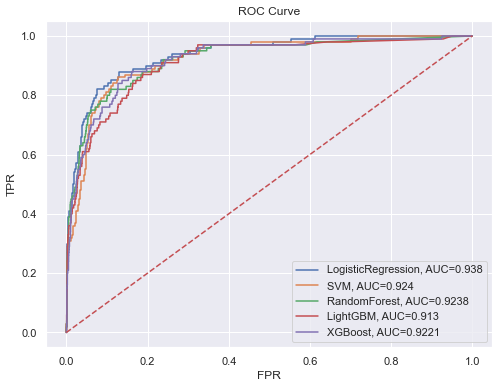

In [79]:
model_names = ['LogisticRegression','SVM', 'RandomForest','LightGBM','XGBoost']
models = [clf_logistic, clf_SVC, clf_random_forest, clf_lgb, clf_xgb]

plt.figure(figsize=(8, 6))

for name, model in zip(model_names, models):
    prob = model.predict_proba(X_test)[:,1]
    fpr, tpr, _ = roc_curve(y_test, prob)
    model_auc = round(auc(fpr, tpr), 4)
    plt.plot(fpr,tpr,label="{}, AUC={}".format(name, model_auc))

random_classifier=np.linspace(0.0, 1.0, 100)
plt.plot(random_classifier, random_classifier, 'r--')
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC Curve")
plt.legend()
plt.show()

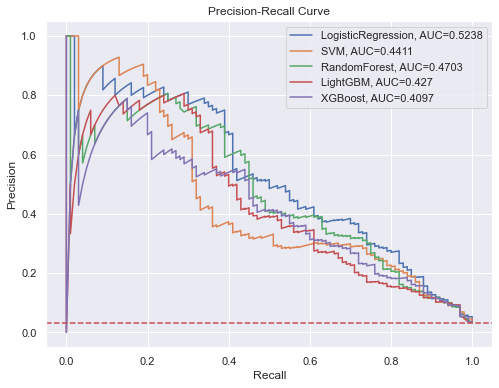

In [80]:
plt.figure(figsize=(8, 6))

for name, model in zip(model_names, models):
    prob = model.predict_proba(X_test)[:,1]
    precision, recall, _ = precision_recall_curve(y_test, prob)
    model_auc = round(auc(recall, precision), 4)
    plt.plot(recall, precision,label="{}, AUC={}".format(name, model_auc))

neg=y_test.value_counts().iloc[0]
pos=y_test.value_counts().iloc[1]

plt.axhline(y=pos/(pos+neg), color='r', linestyle='--')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend()
plt.show()